In [1]:
import numpy as np
from basicpy import BaSiC
from scipy.ndimage import zoom
import zarr
from numcodecs import GZip 

from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
def transform(images, f, d=None):
    if d is not None:
        images_transformed = (np.clip(images-d[np.newaxis],0,None))/f[np.newaxis]
    else:
        images_transformed = images/f[np.newaxis]
        
    return images_transformed

In [3]:
path = "/u/scratch/f/f7xiesnm/sparse06/dataset.n5"
outpath = "/u/home/f/f7xiesnm/project-zipursky/data/hold/sparse06/r1_test_flatfield_v6.n5"
zarr_data = zarr.open(store=zarr.N5Store(path), mode='r')

In [4]:
print(zarr_data[f'/setup0/timepoint0/s0'].shape)
print(zarr_data[f'/setup0/timepoint0/s1'].shape)
print(zarr_data[f'/setup0/timepoint0/s2'].shape)
print(zarr_data[f'/setup0/timepoint0/s3'].shape)
print(zarr_data[f'/setup0/timepoint0/s4'].shape)

(2837, 1920, 1920)
(2837, 960, 960)
(1418, 480, 480)
(709, 240, 240)
(354, 120, 120)


In [5]:
images_raw = np.vstack([
#     zarr_data[f'/setup1/timepoint0/s4'][...],
#     zarr_data[f'/setup2/timepoint0/s4'][...],
#     zarr_data[f'/setup3/timepoint0/s4'][...],
    
#     zarr_data[f'/setup6/timepoint0/s4'][...],
#     zarr_data[f'/setup7/timepoint0/s4'][...],
#     zarr_data[f'/setup8/timepoint0/s4'][...],
    
#     zarr_data[f'/setup11/timepoint0/s4'][...],
#     zarr_data[f'/setup12/timepoint0/s4'][...],
    zarr_data[f'/setup13/timepoint0/s1'][800:810,:,:],
    
    # zarr_data[f'/setup16/timepoint0/s4'][...],
    # zarr_data[f'/setup17/timepoint0/s4'][...],
    # zarr_data[f'/setup18/timepoint0/s4'][...],
])
images_raw.shape

(10, 960, 960)

In [6]:
images_raw

array([[[ 94,  90,  92, ...,  88,  91,  90],
        [ 92,  92,  90, ...,  88,  91,  94],
        [ 94,  91,  92, ...,  91,  92,  94],
        ...,
        [ 90,  91,  87, ...,  95, 100,  99],
        [ 93,  92,  89, ...,  89,  88,  87],
        [ 94,  96,  92, ...,  88,  87,  92]],

       [[ 91,  85,  89, ...,  90,  92,  89],
        [ 90,  93,  93, ...,  90,  91,  89],
        [ 91,  91,  96, ...,  92,  94,  88],
        ...,
        [ 90,  90,  87, ...,  94,  94, 103],
        [ 92,  93,  97, ...,  89,  93,  92],
        [ 88,  93,  91, ...,  86,  94, 104]],

       [[ 91,  93,  86, ...,  86,  93,  92],
        [ 88,  93,  92, ...,  86,  92,  91],
        [ 94,  88,  96, ...,  89,  92,  81],
        ...,
        [ 88,  92,  87, ...,  92,  92, 111],
        [ 95,  91,  91, ...,  89,  85,  89],
        [ 88,  93,  90, ...,  87,  83,  95]],

       ...,

       [[ 89,  90,  92, ...,  88,  91,  94],
        [ 87,  93,  91, ...,  87,  87,  91],
        [ 95,  88,  94, ...,  90,  92,  95

In [7]:
from skimage.filters import difference_of_gaussians as dog

a = np.max(images_raw, axis=0).astype(np.float16)
a = np.clip(a-90, 0, None)
b = dog(a, 0.5, 1.5)

a2 = a.copy() # np.max(images_raw, axis=0)
a2[:500,:500] = 5*a[:500,:500] # np.max(images_raw, axis=0)
b2 = dog(a2, 0.5, 1.5)

a3 = a.copy() # np.max(images_raw, axis=0)
a3[:500,:500] = 100+a[:500,:500] # np.max(images_raw, axis=0)
b3 = dog(a3, 0.5, 1.5)

In [8]:
print(np.min(a))
print(np.percentile(a, 50))
print(np.percentile(a, 80))
print(np.percentile(a, 90))
print(np.percentile(a, 99))
print(np.percentile(a, 99.9))
print(np.percentile(a, 100))

0.0
5.0
8.0
11.0
48.0
197.0
1790.0


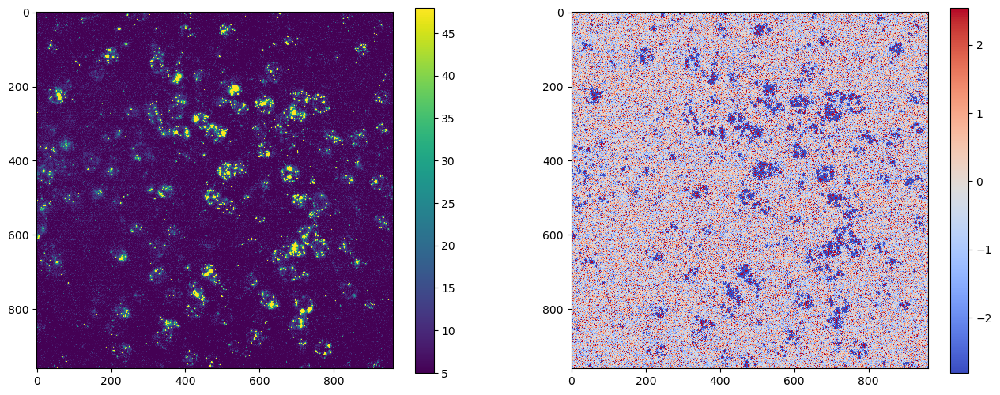

In [9]:
fig, axs = plt.subplots(1,2, figsize=(8*2, 6))
ax = axs[0]
vmax = np.percentile(a, 99)
vmin = np.percentile(a, 50)
g = ax.imshow(a, vmax=vmax, vmin=vmin, interpolation='nearest')
fig.colorbar(g)

ax = axs[1]
vmax = np.percentile(b, 95)
vmin = np.percentile(b, 5)
g = ax.imshow(b, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

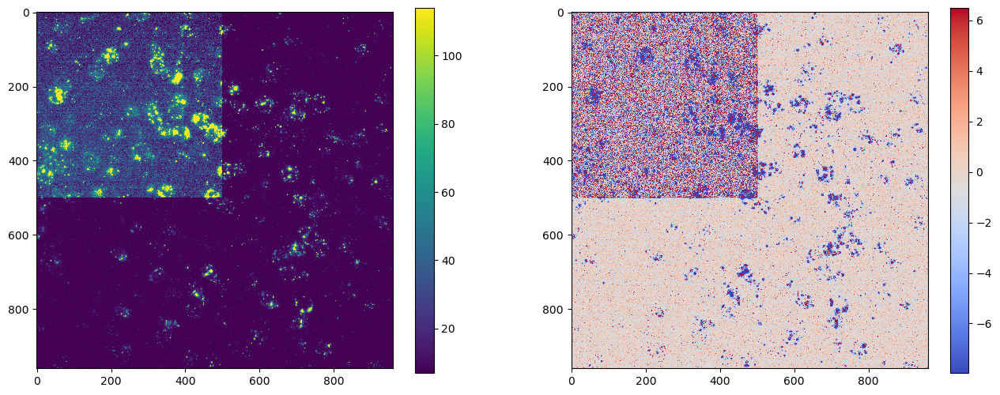

In [10]:
fig, axs = plt.subplots(1,2, figsize=(8*2, 6))
ax = axs[0]
vmax = np.percentile(a2, 99)
vmin = np.percentile(a2, 50)
g = ax.imshow(a2, vmax=vmax, vmin=vmin, interpolation='nearest')
fig.colorbar(g)

ax = axs[1]
vmax = np.percentile(b2, 95)
vmin = np.percentile(b2, 5)
g = ax.imshow(b2, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

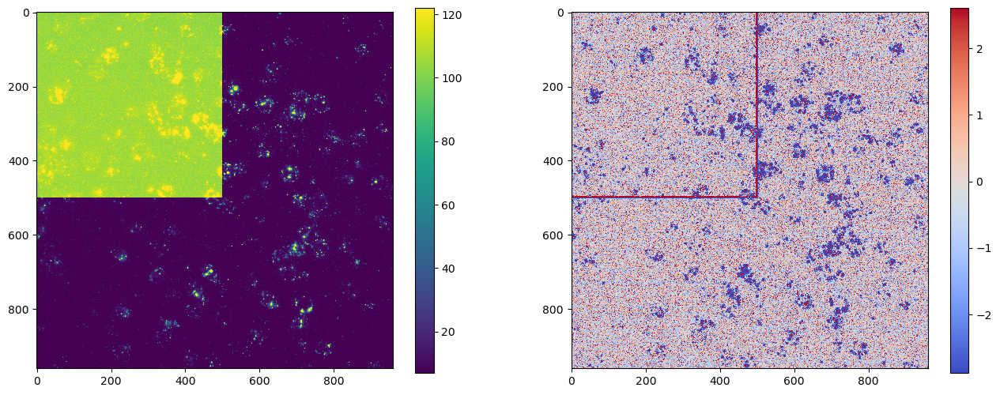

In [11]:
fig, axs = plt.subplots(1,2, figsize=(8*2, 6))
ax = axs[0]
vmax = np.percentile(a3, 99)
vmin = np.percentile(a3, 50)
g = ax.imshow(a3, vmax=vmax, vmin=vmin, interpolation='nearest')
fig.colorbar(g)

ax = axs[1]
vmax = np.percentile(b3, 95)
vmin = np.percentile(b3, 5)
g = ax.imshow(b3, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

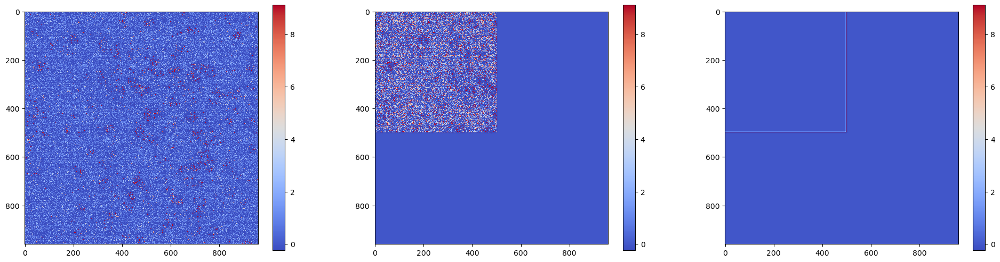

In [12]:
fig, axs = plt.subplots(1,3, figsize=(8*3, 6))
ax = axs[0]
vmax = np.percentile(b, 99)
vmin = np.percentile(b, 50)
g = ax.imshow(b, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

ax = axs[1]
# vmax = np.percentile(b2, 99)
# vmin = np.percentile(b2, 50)
g = ax.imshow(b2-b, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

ax = axs[2]
# vmax = np.percentile(b3, 99)
# vmin = np.percentile(b3, 50)
g = ax.imshow(b3-b, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

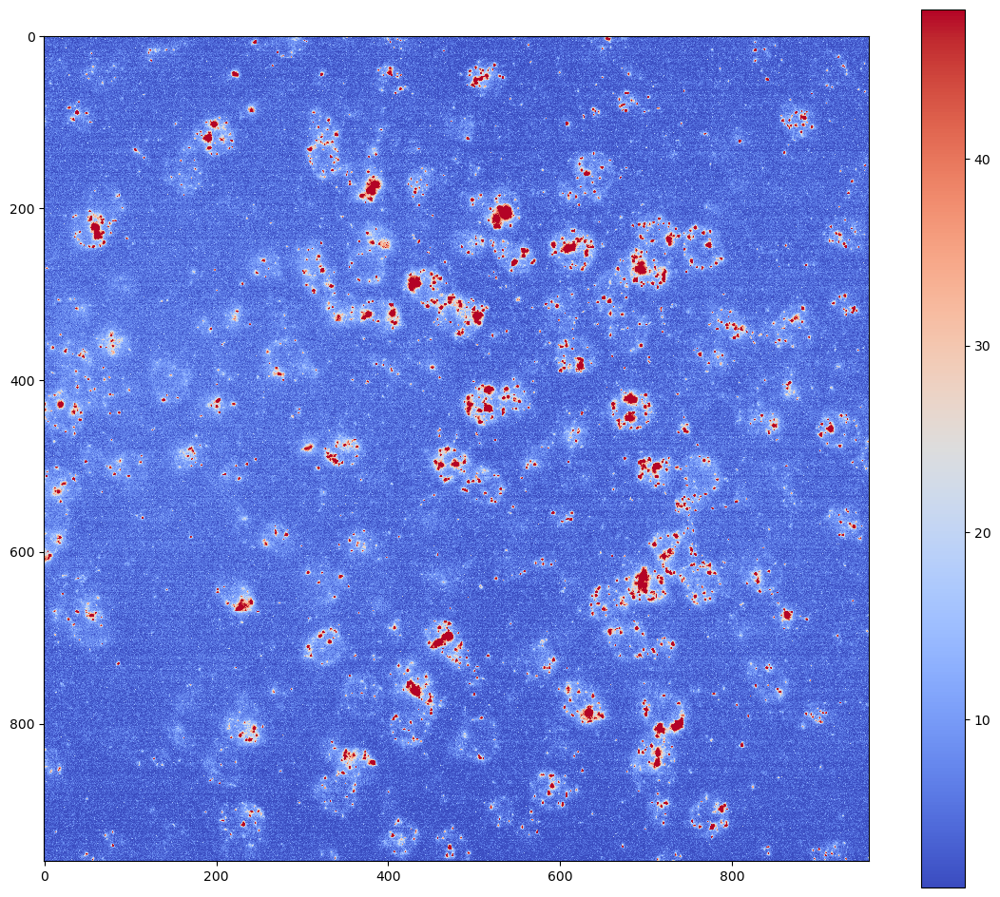

In [13]:
fig, ax = plt.subplots(1,1, figsize=(14,12))
vmax = np.percentile(a, 99)
vmin = np.percentile(a, 5)
g = ax.imshow(a, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

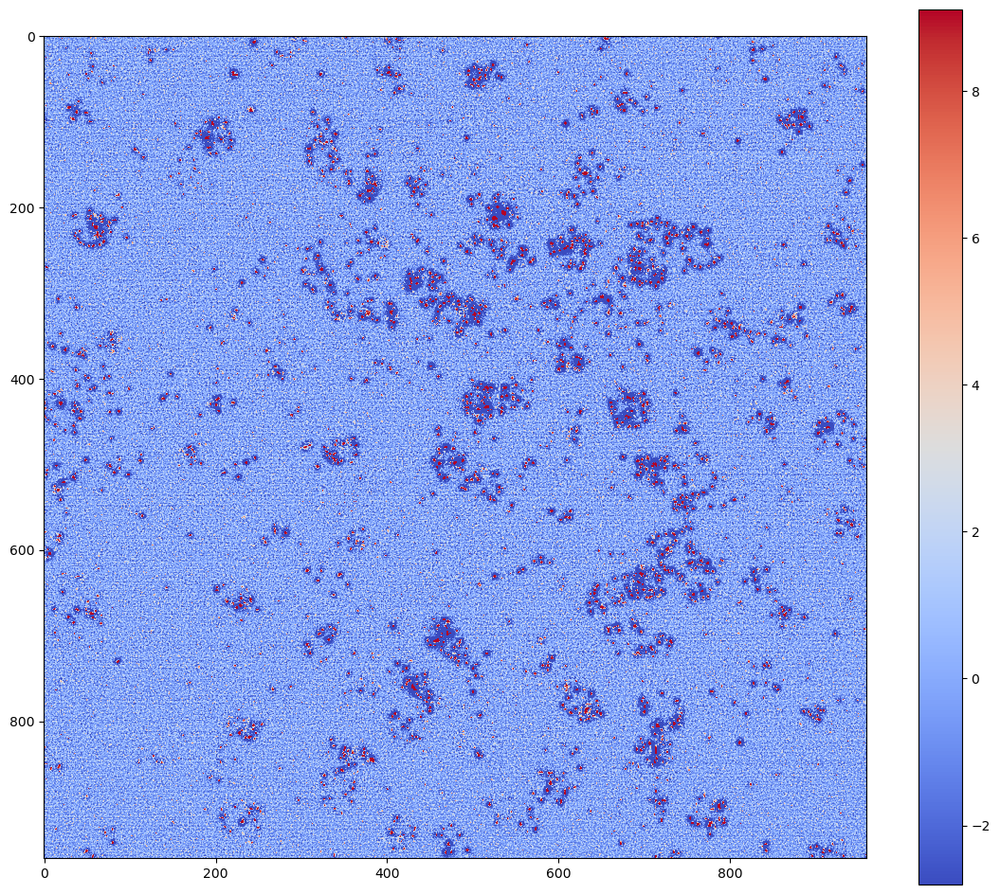

In [14]:
fig, ax = plt.subplots(1,1, figsize=(14,12))
vmax = np.percentile(b, 99)
vmin = np.percentile(b, 5)
g = ax.imshow(b, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

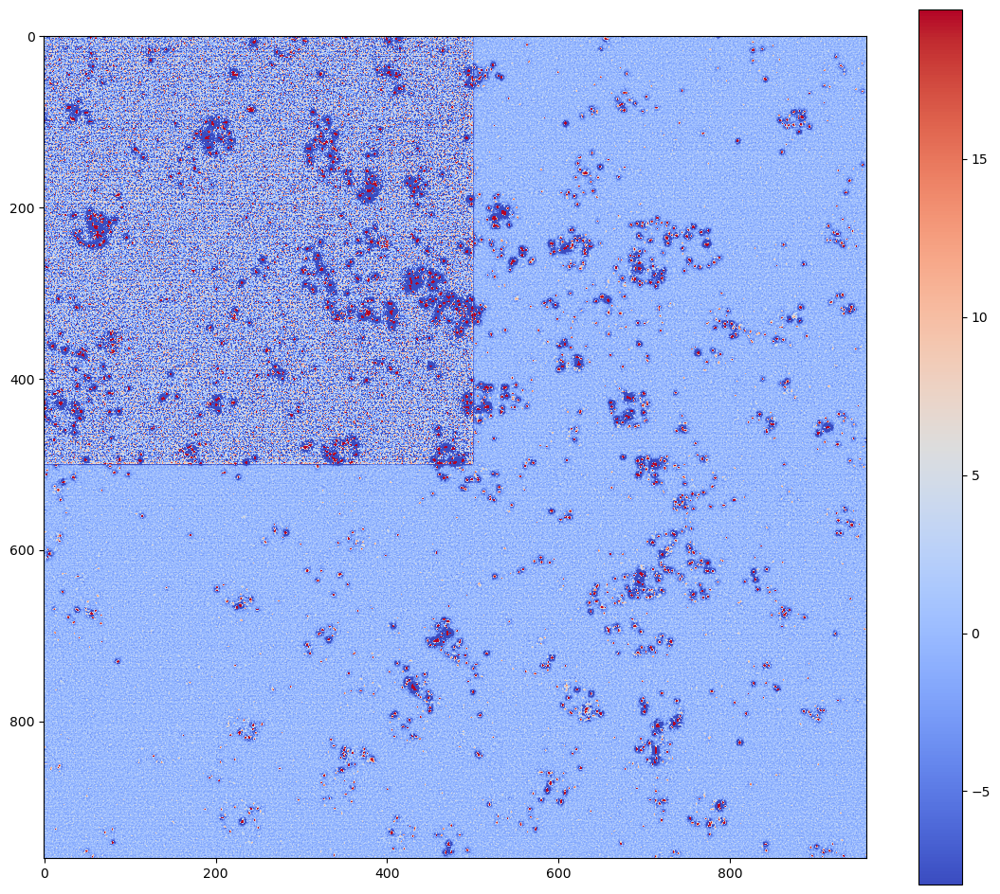

In [15]:
fig, ax = plt.subplots(1,1, figsize=(14,12))
vmax = np.percentile(b2, 99)
vmin = np.percentile(b2, 5)
g = ax.imshow(b2, vmax=vmax, vmin=vmin, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

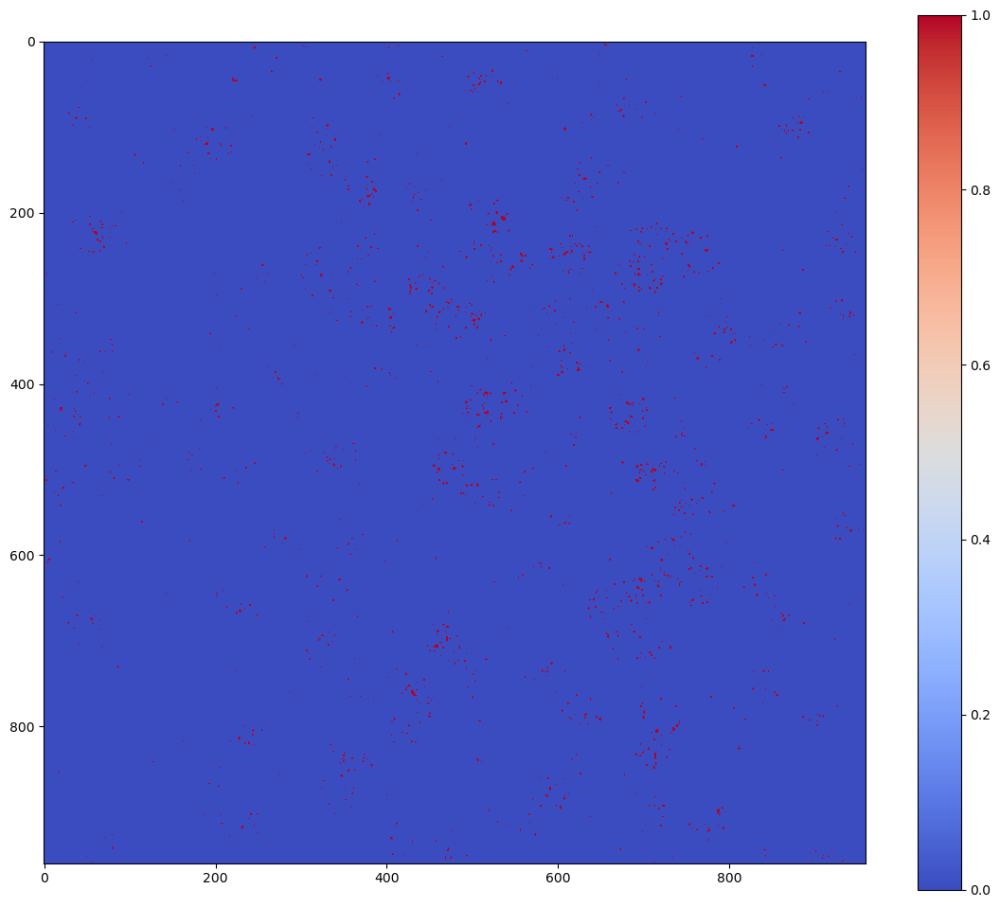

In [16]:
fig, ax = plt.subplots(1,1, figsize=(14,12))
# vmax = np.percentile(b, 95)
# vmin = np.percentile(b, 5)
g = ax.imshow(b>20, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

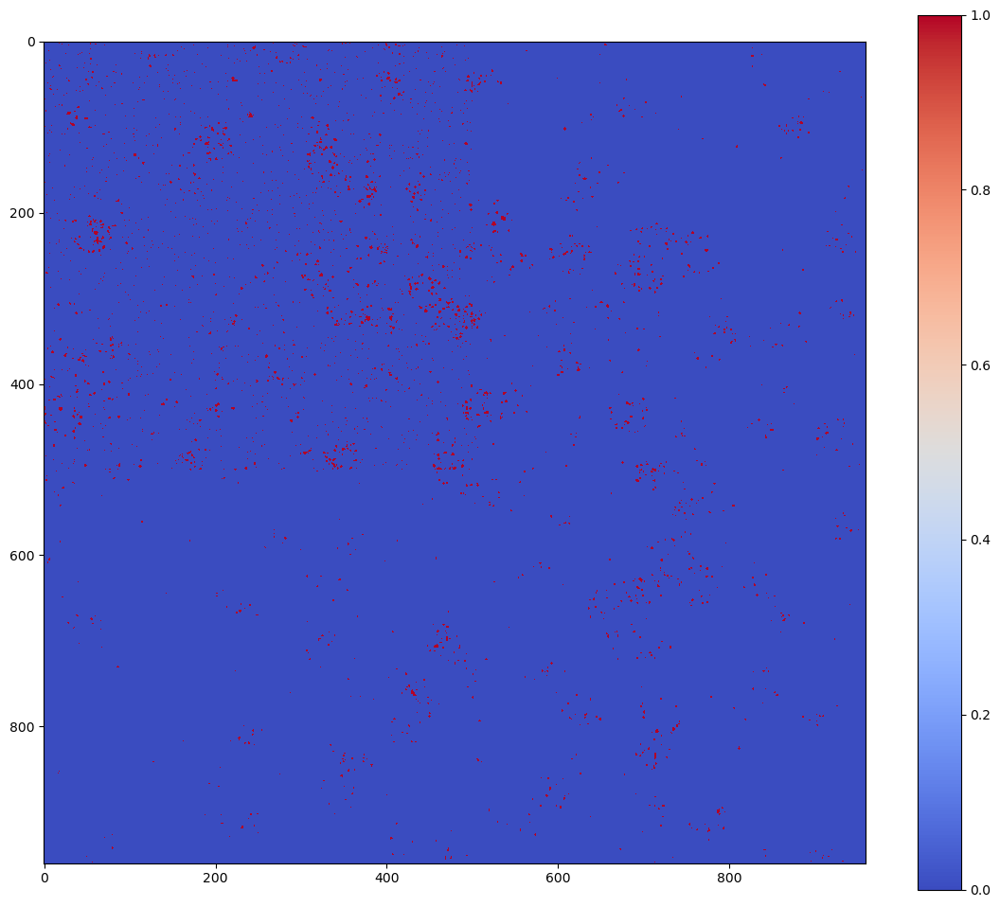

In [17]:
fig, ax = plt.subplots(1,1, figsize=(14,12))
# vmax = np.percentile(b, 95)
# vmin = np.percentile(b, 5)
g = ax.imshow(b2>20, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)

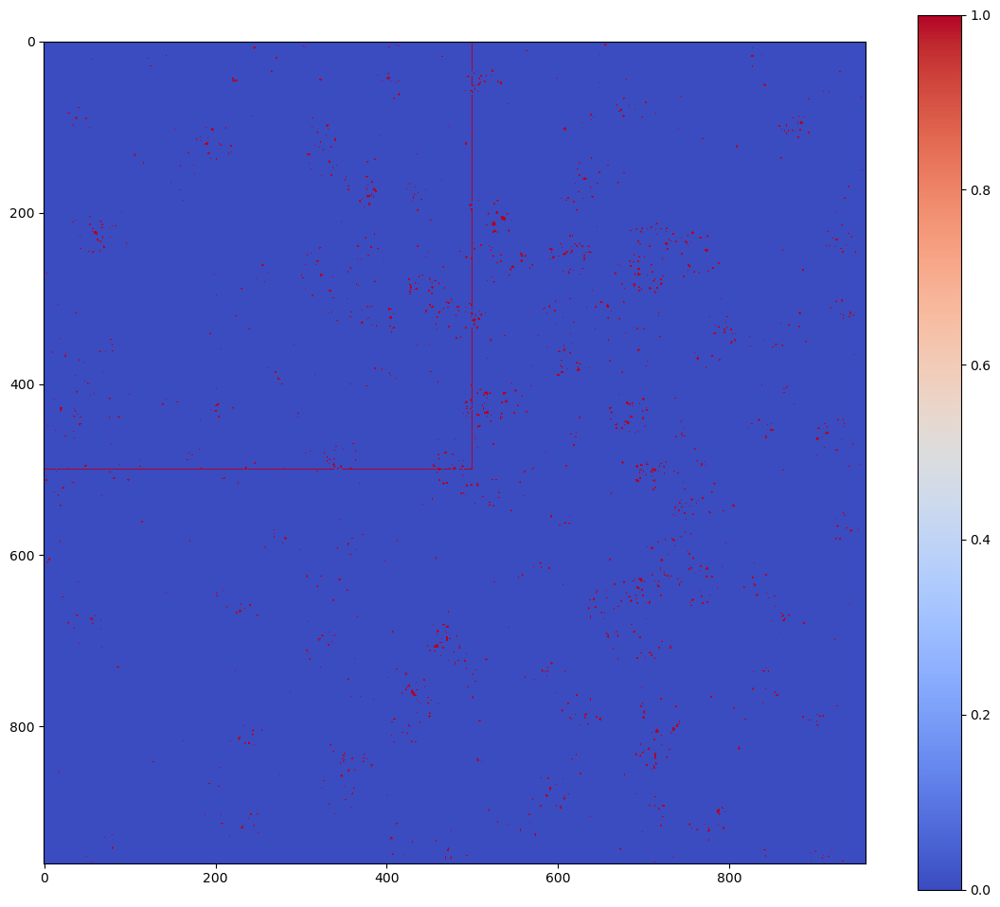

In [18]:
fig, ax = plt.subplots(1,1, figsize=(14,12))
# vmax = np.percentile(b, 95)
# vmin = np.percentile(b, 5)
g = ax.imshow(b3>20, cmap='coolwarm', interpolation='nearest')
fig.colorbar(g)